In [1]:
import sys, os
sys.path.insert(1, 'utils')

In [2]:
import os, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits import mplot3d
import matplotlib as mpl
%matplotlib inline

In [28]:
def regressionLoss(y_pred, y_true, metric = 'RAE', outlier_filter = False, outlier_thres = 20):
    metric = metric.lower()
    if outlier_filter:
        std = regressionLoss(y_pred, y_true, metric, False)
        outlier_flag = (np.abs(y_pred - y_true) > std*outlier_thres)
        num_outlier = np.sum(outlier_flag)
        return regressionLoss(y_pred[~outlier_flag], y_true[~outlier_flag], metric, False), num_outlier

    y_true, y_pred = np.array(y_true), np.array(y_pred)
    y_mean = y_true.mean()
    if metric == 'rae':
        return sum(abs(y_pred - y_true)) / sum(abs(y_mean - y_true))
    elif metric == 'rse':
        return sum((y_pred - y_true)**2) / sum((y_mean - y_true)**2)
    elif metric == 'rmse':
        return ((y_pred - y_true)**2).mean()**.5
    elif metric == 'r square':
        sst = sum((y_true - y_mean) ** 2)
        ssr = sum((y_true - y_pred) ** 2)
        return 1 - ssr/sst

# All

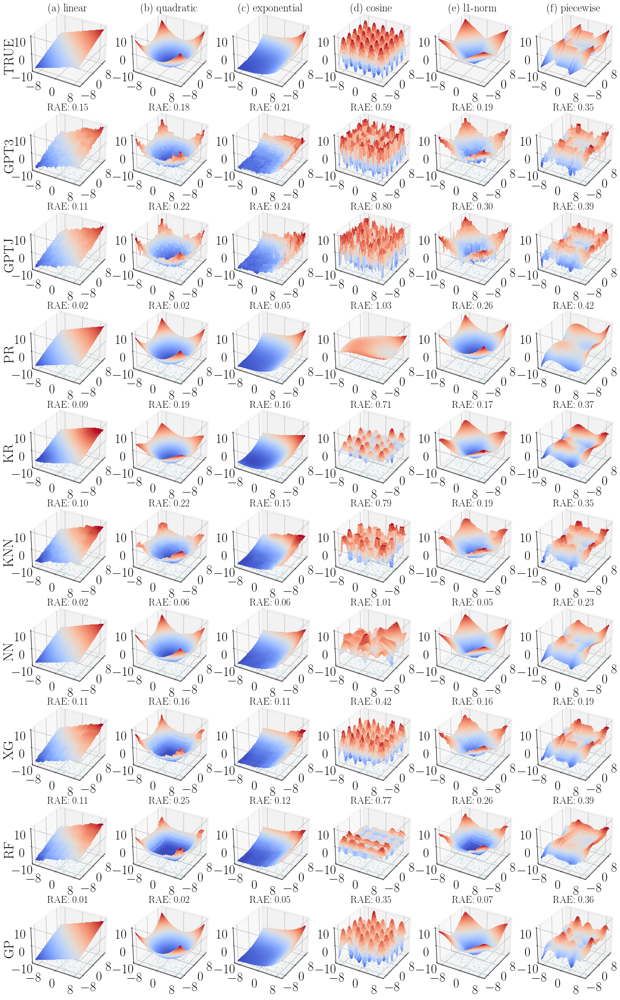

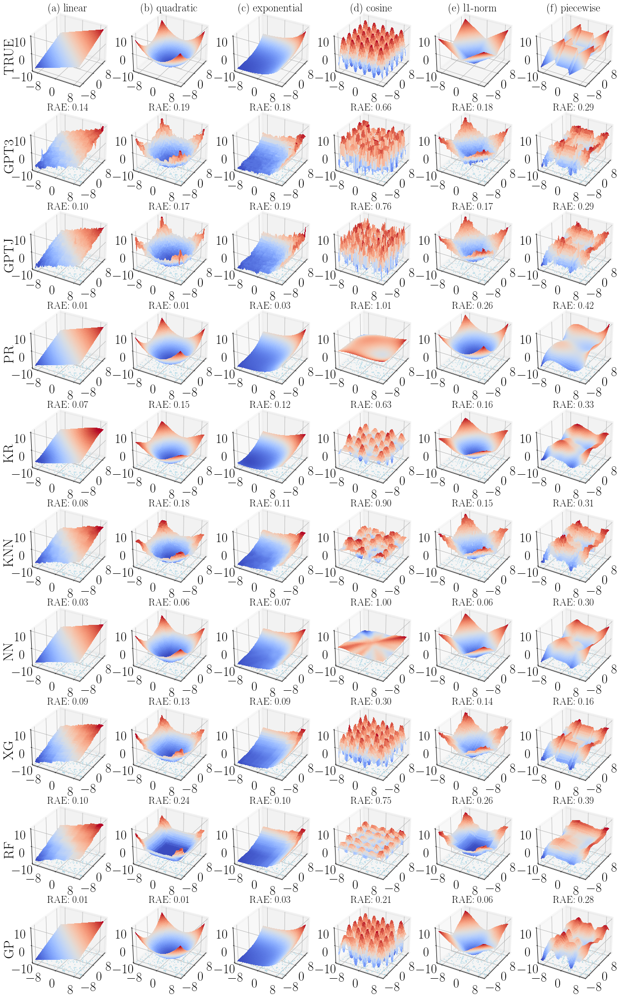

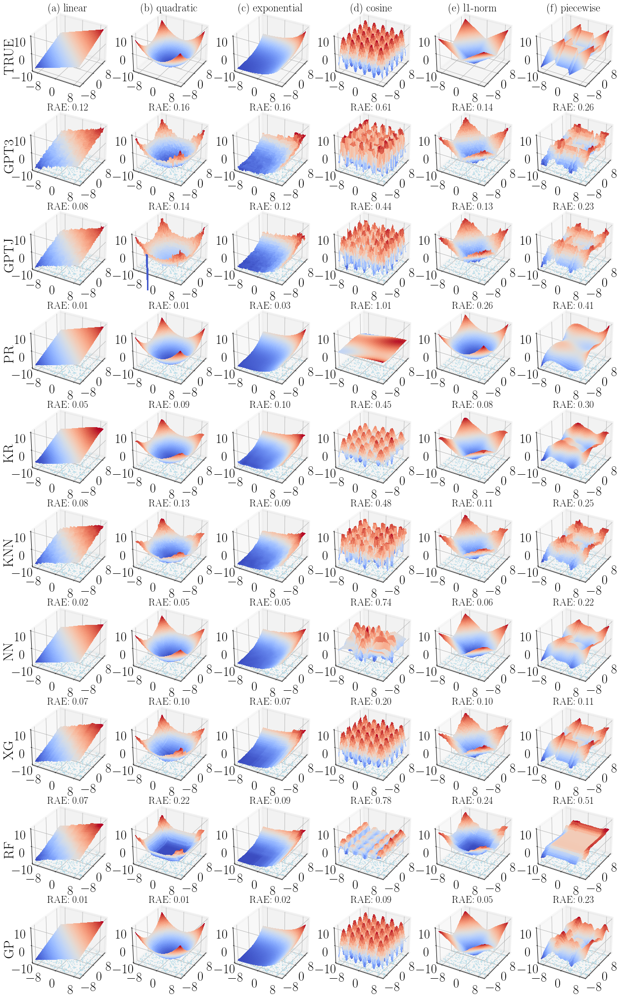

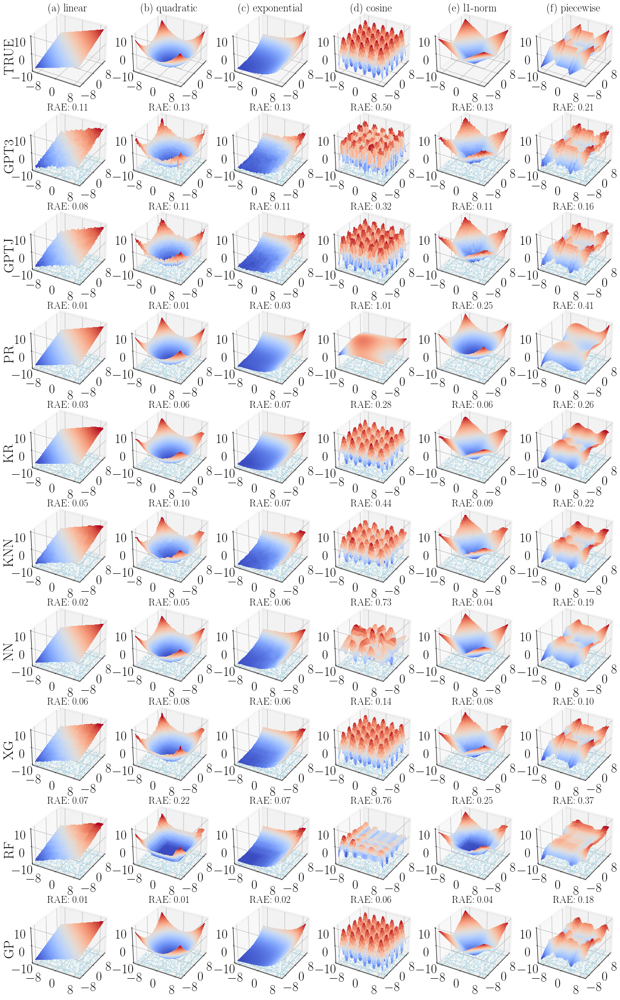

In [30]:
func_list = ['(a) linear', '(b) quadratic', '(c) exponential',
            '(d) cosine', '(e) l1-norm', '(f) piecewise']
baseline_list = ['PR', 'KR', 'KNN', 'NN', 'XG', 'RF', 'GP']
grid_y_list = ['poly_grid_y', 'krr_grid_y', 'knn_grid_y', 'nn_grid_y', 'xg_grid_y', 'rf_grid_y', 'gp_grid_y']

for number in [200, 300, 500, 1000]:
    n_file = number + 50
    file_list = [
        'linear_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'quadratic_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'exponential_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'cosine_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'l1norm_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json'% n_file,
        'piecewise_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json'% n_file,
    ]

    width = 18
    height = 28

    plt.rc('font', family='serif', serif='times new roman')
    plt.rc('text', usetex=True)
    mpl.rc('text.latex', preamble=r'\usepackage{amsmath}')
    plt.rc('xtick', labelsize=26)
    plt.rc('ytick', labelsize=26)
    plt.rc('ytick', labelsize=26)
    plt.rc('axes', labelsize=28)
    plt.rc('axes', linewidth=1)
    mpl.rcParams['patch.linewidth']=5 #width of the boundary of legend
    fig = plt.figure(figsize=plt.figaspect(0.5))
    fig.set_size_inches(width, height) #exact size of the figure
    fig.subplots_adjust(left=.05, bottom=.01, right=.97, top=1, hspace = 0.02, wspace = 0.2) #margin of the figure

    for i in range(6):
        with open(os.path.join('2Dvis/data_1', file_list[i]), 'r') as fp:
            data_json = json.load(fp)

        X = np.array(data_json['grid_x'])
        gpt3_y = np.array(data_json['gpt3_grid_y'])
        invalid_idx = gpt3_y == None
        pc_invalid = (invalid_idx).mean()

        grid_y = np.array(data_json['grid_y'])
        loss = data_json['loss_grid_woe'][0]
        x = X.T[0].reshape(60,60)
        y = X.T[1].reshape(60,60)
        z = gpt3_y.reshape(60,60)
        idx = ((x >= -9.9) & (x <= 9.9) & (y >= -9.9) & (y <= 9.9)).reshape(-1)
        x = x.reshape(-1)[idx].reshape(48,48)
        y = y.reshape(-1)[idx].reshape(48,48)
        z = z.reshape(-1)[idx].reshape(48,48)
        outlier_idx = (z > 10) | (z < -10)
        z[outlier_idx] = np.array(data_json['train_y']).mean()

        X_train = np.array(data_json['train_x'])

        # GPT3
        ax = fig.add_subplot(10, 6, i+7, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # print("Invalid output: {a: .2f}%, loss: {b: .2f}".format(a=pc_invalid * 100, b=loss))
        ax.set_title("RAE: %.2f" % (loss), fontsize = 20, y = 1)
        ax.set_ylim(-10, 10)
        ax.set_xlim(-10, 10)
        ax.set_zlim(-10, 10)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        h,_ = ax.get_zlim()
        ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')
        if i==0: 
            # ax.zaxis.set_ticks_position('top')
            ax.set_zlabel('GPT3', rotation = 90)
    #         ax.zaxis.set_label_coords(-10, 1)
    #         ax.view_init(25, -45)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])

        # GPTJ
        gptj_y = np.array(data_json['gptj_grid_y'])
        z = gptj_y.reshape(60,60)
        z = z.reshape(-1)[idx].reshape(48,48)
        ax = fig.add_subplot(10, 6, i+13, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # print("Invalid output: {a: .2f}%, loss: {b: .2f}".format(a=pc_invalid * 100, b=loss))
        loss_gptj = data_json['loss_grid_gptj_woe']
        ax.set_title("RAE: %.2f" % (loss_gptj), fontsize = 20, y = 1)
        ax.set_ylim(-10, 10)
        ax.set_xlim(-10, 10)
        ax.set_zlim(-10, 10)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        h,_ = ax.get_zlim()
        ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')
        if i==0: 
            # ax.zaxis.set_ticks_position('top')
            ax.set_zlabel('GPTJ', rotation = 90)
    #         ax.zaxis.set_label_coords(-10, 1)
    #         ax.view_init(25, -45)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])

        for bsl_idx in range(len(baseline_list)):
            baseline = baseline_list[bsl_idx]
            qr_y = np.array(data_json[grid_y_list[bsl_idx]])
            z = qr_y.reshape(-1)[idx].reshape(48,48)
            loss_qr = data_json['%s_loss_grid_woe' % grid_y_list[bsl_idx].split('_')[0]]
            ax = fig.add_subplot(10, 6, i+1+6*(bsl_idx+3), projection='3d')
            ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
            ax.set_title("RAE: %.2f" % loss_qr, fontsize = 20, y = 1)
            ax.set_ylim(-10, 10)
            ax.set_xlim(-10, 10)
            ax.set_zlim(-10, 10)
            ax.set_xticks((-8, 0, 8))
            ax.set_yticks((-8, 0, 8))
            ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')
            if i==0: 
                ax.set_zlabel(baseline, rotation = 90)
                tmp_planes = ax.zaxis._PLANES 
                ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                    tmp_planes[0], tmp_planes[1], 
                                    tmp_planes[4], tmp_planes[5])
            else:
                tmp_planes = ax.zaxis._PLANES 
                ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                    tmp_planes[0], tmp_planes[1], 
                                    tmp_planes[4], tmp_planes[5])

        # True function
        z = grid_y.reshape(-1)[idx].reshape(48,48)
        ax = fig.add_subplot(10, 6, i+1, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # ax.plot_surface(x, y, z, color="lightblue", alpha = 0.3)
        ax.set_title(func_list[i], fontsize = 22, y = 1)

        # ax.set_title(func_list[i], fontsize = 28, y = 1)
        ax.set_ylim(-10, 10)
        ax.set_xlim(-10, 10)
        ax.set_zlim(-10, 10)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        if i==0: 
            # ax.zaxis.set_ticks_position('top')
            ax.set_zlabel('TRUE', rotation = 90)
    #         ax.zaxis.set_label_coords(-10, 1)
    #         ax.view_init(25, -45)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])

    plt.savefig(os.path.join('figures','2Dvis_all_n_%d.pdf' % number))
    None

# Extrapolation

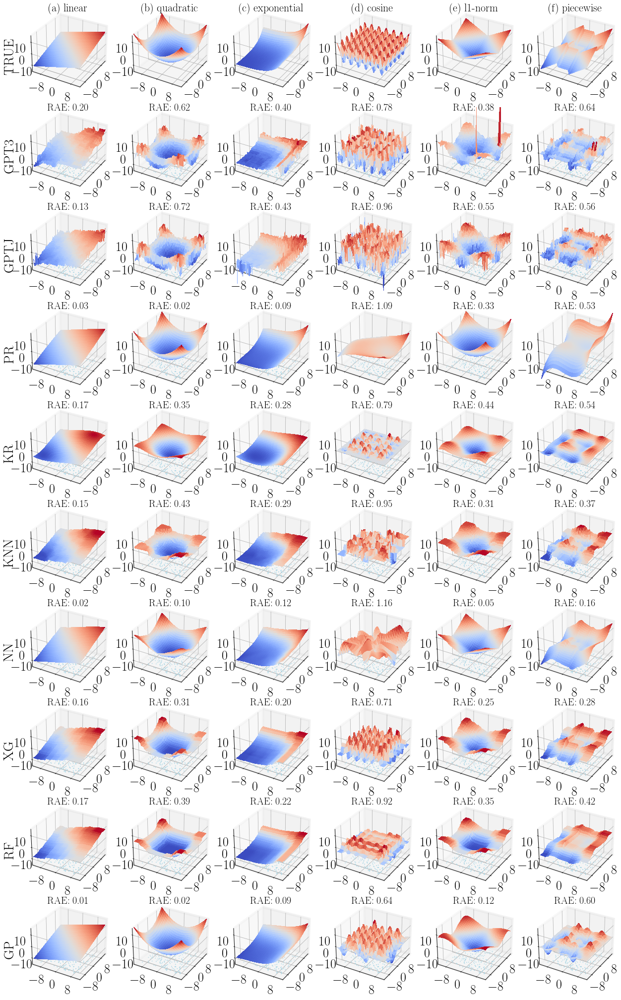

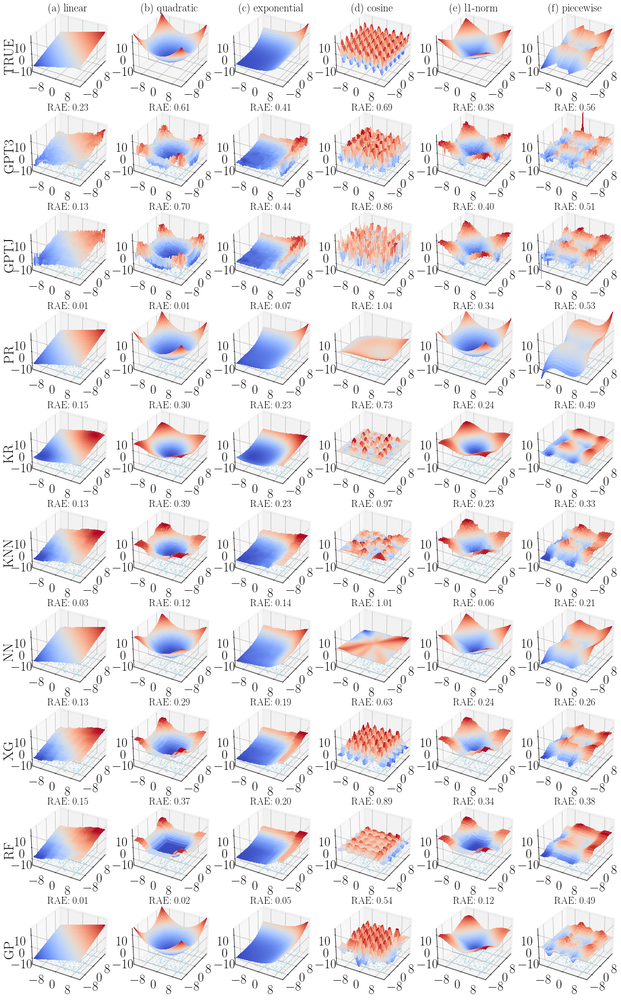

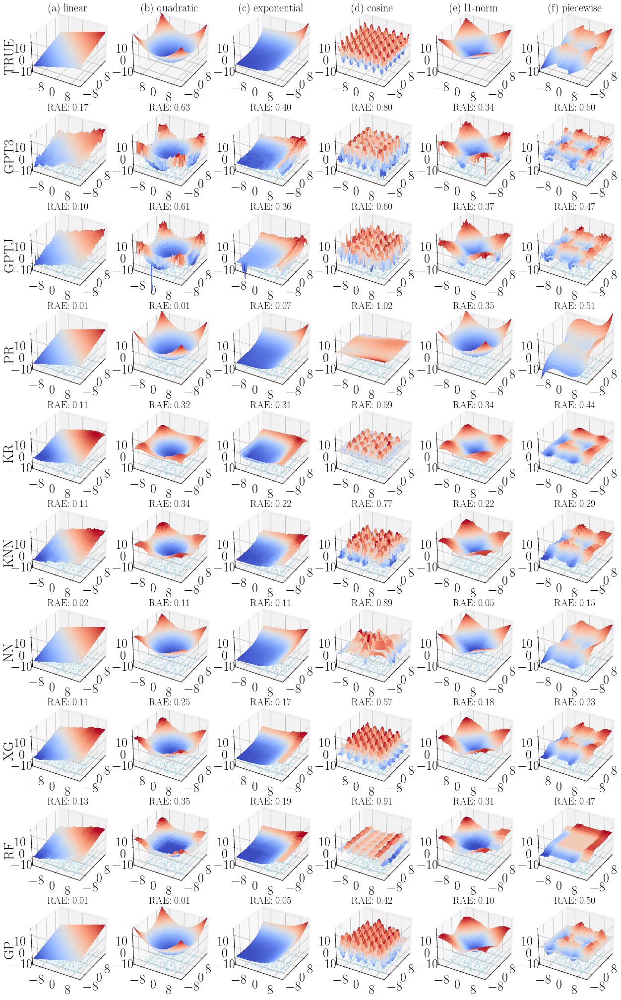

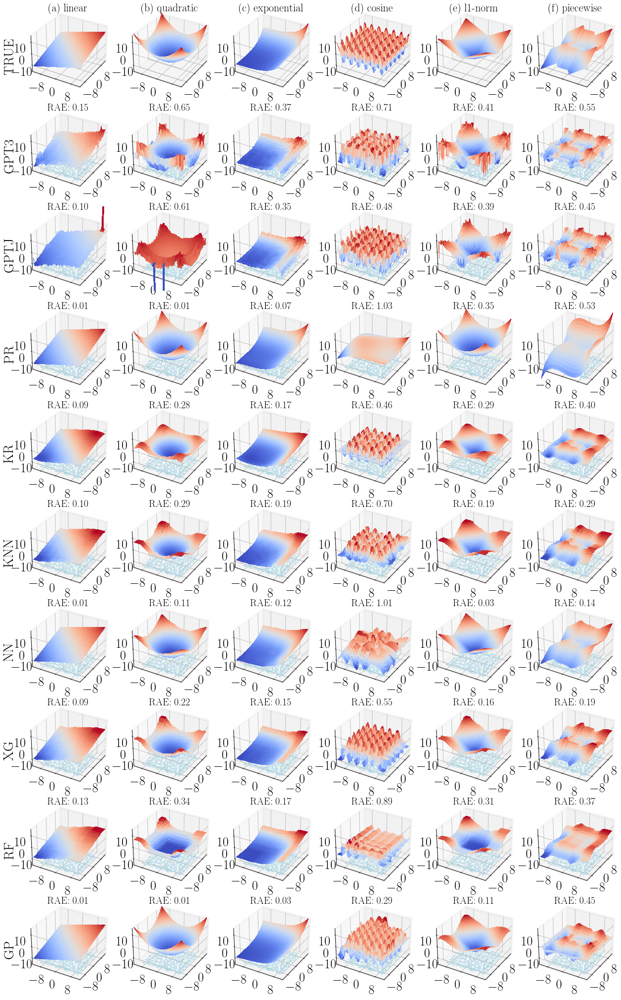

In [22]:
func_list = ['(a) linear', '(b) quadratic', '(c) exponential',
            '(d) cosine', '(e) l1-norm', '(f) piecewise']
baseline_list = ['PR', 'KR', 'KNN', 'NN', 'XG', 'RF', 'GP']
grid_y_list = ['poly_grid_y', 'krr_grid_y', 'knn_grid_y', 'nn_grid_y', 'xg_grid_y', 'rf_grid_y', 'gp_grid_y']

for number in [200, 300, 500, 1000]:
    n_file = number + 50
    file_list = [
        'linear_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'quadratic_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'exponential_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'cosine_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n_file,
        'l1norm_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json'% n_file,
        'piecewise_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json'% n_file,
    ]

    width = 18
    height = 28

    plt.rc('font', family='serif', serif='times new roman')
    plt.rc('text', usetex=True)
    mpl.rc('text.latex', preamble=r'\usepackage{amsmath}')
    plt.rc('xtick', labelsize=26)
    plt.rc('ytick', labelsize=26)
    plt.rc('ytick', labelsize=26)
    plt.rc('axes', labelsize=28)
    plt.rc('axes', linewidth=1)
    mpl.rcParams['patch.linewidth']=5 #width of the boundary of legend
    fig = plt.figure(figsize=plt.figaspect(0.5))
    fig.set_size_inches(width, height) #exact size of the figure
    fig.subplots_adjust(left=.05, bottom=.01, right=.97, top=1, hspace = 0.02, wspace = 0.2) #margin of the figure

    for i in range(6):
        with open(os.path.join('2Dvis/data_1', file_list[i]), 'r') as fp:
            data_json = json.load(fp)

        X = np.array(data_json['grid_x'])
        gpt3_y = np.array(data_json['gpt3_grid_y'])
        invalid_idx = gpt3_y == None
        pc_invalid = (invalid_idx).mean()

        grid_y = np.array(data_json['grid_y'])
        loss = data_json['loss_grid'][0]
        x = X.T[0].reshape(60,60)
        y = X.T[1].reshape(60,60)
        z = gpt3_y.reshape(60,60)
        outlier_idx = (z > 50) | (z < -50)
        z[outlier_idx] = np.array(data_json['train_y']).mean()

        X_train = np.array(data_json['train_x'])

        # GPT3
        ax = fig.add_subplot(10, 6, i+7, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # print("Invalid output: {a: .2f}%, loss: {b: .2f}".format(a=pc_invalid * 100, b=loss))
        ax.set_title("RAE: %.2f" % (loss), fontsize = 20, y = 1)
        ax.set_ylim(-12, 12)
        ax.set_xlim(-12, 12)
        ax.set_zlim(-15, 15)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        h,_ = ax.get_zlim()
        ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')
        if i==0: 
            # ax.zaxis.set_ticks_position('top')
            ax.set_zlabel('GPT3', rotation = 90)
    #         ax.zaxis.set_label_coords(-10, 1)
    #         ax.view_init(25, -45)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        # GPTJ
        gptj_y = np.array(data_json['gptj_grid_y'])
        loss_gptj = data_json['gptj_grid_loss']
        z = gptj_y.reshape(60,60)
        ax = fig.add_subplot(10, 6, i+13, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # print("Invalid output: {a: .2f}%, loss: {b: .2f}".format(a=pc_invalid * 100, b=loss))
        ax.set_title("RAE: %.2f" % (loss_gptj), fontsize = 20, y = 1)
        ax.set_ylim(-12, 12)
        ax.set_xlim(-12, 12)
        ax.set_zlim(-15, 15)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        h,_ = ax.get_zlim()
        ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')
        if i==0: 
            # ax.zaxis.set_ticks_position('top')
            ax.set_zlabel('GPTJ', rotation = 90)
    #         ax.zaxis.set_label_coords(-10, 1)
    #         ax.view_init(25, -45)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])

        for bsl_idx in range(len(baseline_list)):
            baseline = baseline_list[bsl_idx]
            qr_y = np.array(data_json[grid_y_list[bsl_idx]])
            z = qr_y.reshape(60,60)
            loss_qr = data_json['%s_loss_grid' % grid_y_list[bsl_idx].split('_')[0]]
            ax = fig.add_subplot(10, 6, i+1+6*(bsl_idx+3), projection='3d')
            ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
            ax.set_title("RAE: %.2f" % loss_qr, fontsize = 20, y = 1)
            ax.set_ylim(-12, 12)
            ax.set_xlim(-12, 12)
            ax.set_zlim(-15, 15)
            ax.set_xticks((-8, 0, 8))
            ax.set_yticks((-8, 0, 8))
            ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')
            if i==0: 
                ax.set_zlabel(baseline, rotation = 90)
                tmp_planes = ax.zaxis._PLANES 
                ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                    tmp_planes[0], tmp_planes[1], 
                                    tmp_planes[4], tmp_planes[5])
            else:
                tmp_planes = ax.zaxis._PLANES 
                ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                    tmp_planes[0], tmp_planes[1], 
                                    tmp_planes[4], tmp_planes[5])

        # True function
        z = grid_y.reshape(60,60)
        ax = fig.add_subplot(10, 6, i+1, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # ax.plot_surface(x, y, z, color="lightblue", alpha = 0.3)
        ax.set_title(func_list[i], fontsize = 22, y = 1)

        # ax.set_title(func_list[i], fontsize = 28, y = 1)
        ax.set_ylim(-12, 12)
        ax.set_xlim(-12, 12)
        ax.set_zlim(-15, 15)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        if i==0: 
            # ax.zaxis.set_ticks_position('top')
            ax.set_zlabel('TRUE', rotation = 90)
    #         ax.zaxis.set_label_coords(-10, 1)
    #         ax.view_init(25, -45)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])

    plt.savefig(os.path.join('figures','2Dvis_all_extrapolate_n_%d.pdf' % number))
    None

# no extrapolation

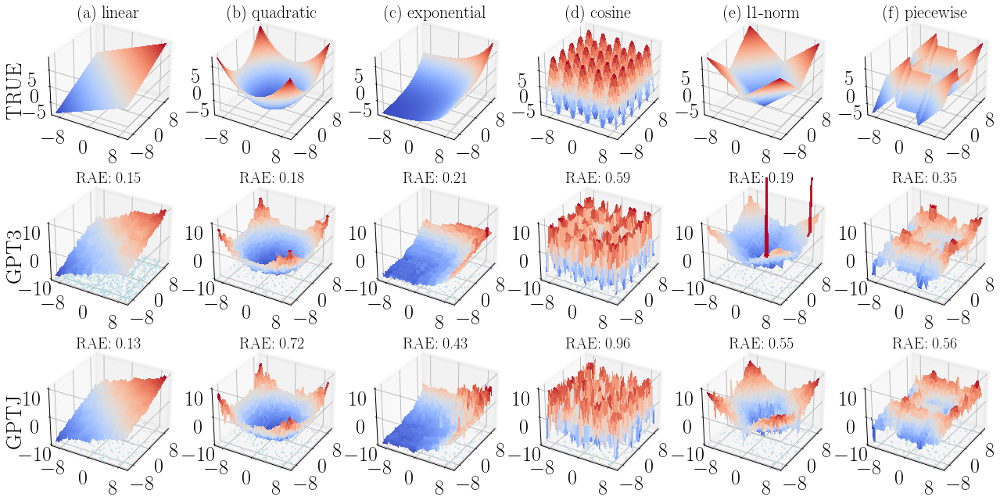

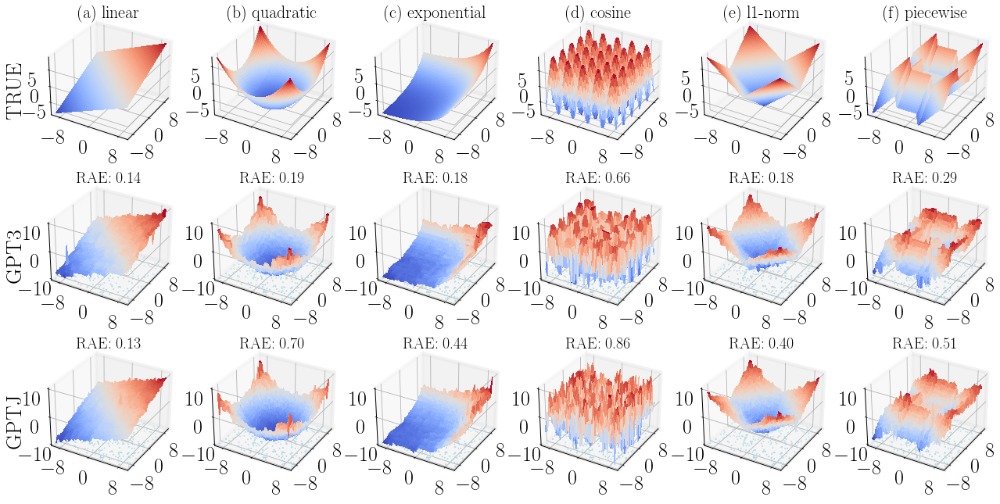

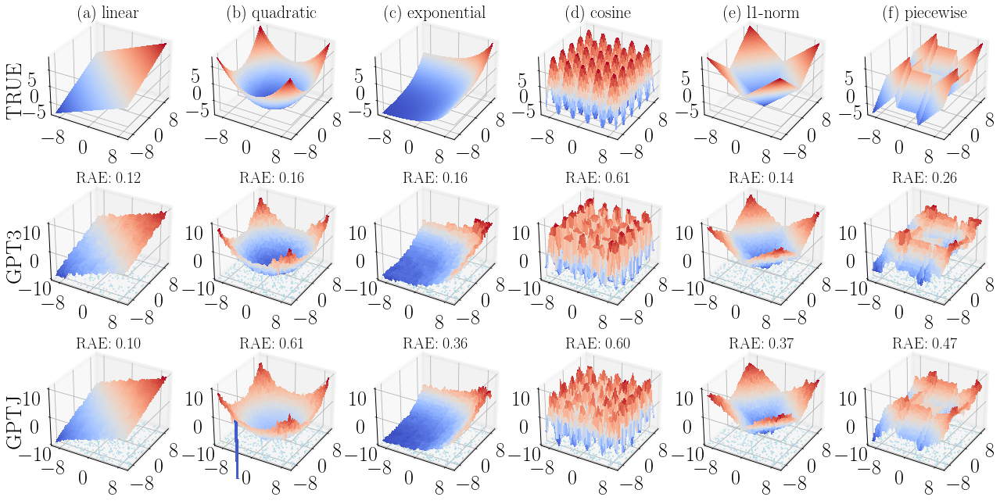

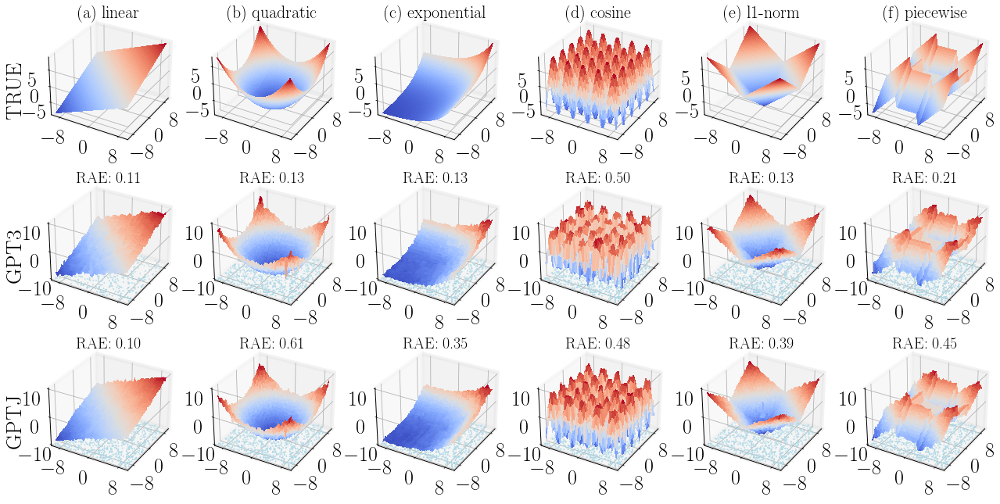

In [8]:
for n_train in [200, 300, 500, 1000]:
    n = n_train + 50
    file_list = [
        'linear_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n,
        'quadratic_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n,
        'exponential_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n,
        'cosine_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n,
        'l1norm_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n,
        'piecewise_n_%d_p_2_int_0_(-10.0,10.0)_noise_0.10_all.json' % n
    ]

    func_list = ['(a) linear function', '(b) quadratic function', '(c) exponential function',
                '(d) cosine function', '(e) l1-norm function', '(f) piecewise function']

    func_list = ['(a) linear', '(b) quadratic', '(c) exponential',
                '(d) cosine', '(e) l1-norm', '(f) piecewise']


    width = 18
    height = 9

    plt.rc('font', family='serif', serif='times new roman')
    plt.rc('text', usetex=True)
    mpl.rc('text.latex', preamble=r'\usepackage{amsmath}')
    plt.rc('xtick', labelsize=26)
    plt.rc('ytick', labelsize=26)
    plt.rc('ytick', labelsize=26)
    plt.rc('axes', labelsize=28)
    plt.rc('axes', linewidth=1)
    mpl.rcParams['patch.linewidth']=5 #width of the boundary of legend
    fig = plt.figure(figsize=plt.figaspect(0.5))
    fig.set_size_inches(width, height) #exact size of the figure
    fig.subplots_adjust(left=.05, bottom=.02, right=0.99, top=1, hspace = 0, wspace = 0.2) #margin of the figure

    for i in range(6):
        with open(os.path.join('2Dvis/data_1', file_list[i]), 'r') as fp:
            data_json = json.load(fp)

        X = np.array(data_json['grid_x'])
        gpt3_y = np.array(data_json['gpt3_grid_y'])
        invalid_idx = gpt3_y == None
        pc_invalid = (invalid_idx).mean()

        grid_y = np.array(data_json['grid_y'])
        loss = data_json['loss_grid_woe'][0]
        x = X.T[0].reshape(60,60)
        y = X.T[1].reshape(60,60)
        z = gpt3_y.reshape(60,60)
        idx = ((x >= -9.9) & (x <= 9.9) & (y >= -9.9) & (y <= 9.9)).reshape(-1)
        x = x.reshape(-1)[idx].reshape(48,48)
        y = y.reshape(-1)[idx].reshape(48,48)
        z = z.reshape(-1)[idx].reshape(48,48)
        outlier_idx = (z > 100) | (z < -100)
        z[outlier_idx] = np.array(data_json['train_y']).mean()
        # if i == 2: break

        ax = fig.add_subplot(3, 6, i+7, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # print("Invalid output: {a: .2f}%, loss: {b: .2f}".format(a=pc_invalid * 100, b=loss))
        ax.set_title("RAE: %.2f" % (loss), fontsize = 20, y = 1)
        ax.set_ylim(-10, 10)
        ax.set_xlim(-10, 10)
        ax.set_zlim(-10, 10)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        if i==0: 
            ax.set_zlabel('GPT3', rotation = 90)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')

        gptj_y = np.array(data_json['gptj_grid_y'])
        loss_gptj = data_json['gptj_grid_loss']
        z = gptj_y.reshape(60,60)
        z = z.reshape(-1)[idx].reshape(48,48)

        ax = fig.add_subplot(3, 6, i+13, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # print("Invalid output: {a: .2f}%, loss: {b: .2f}".format(a=pc_invalid * 100, b=loss))
        ax.set_title("RAE: %.2f" % (loss_gptj), fontsize = 20, y = 1)
        ax.set_ylim(-10, 10)
        ax.set_xlim(-10, 10)
        ax.set_zlim(-10, 10)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))
        if i==0: 
            ax.set_zlabel('GPTJ', rotation = 90)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])

        X_train = np.array(data_json['train_x'])
        h,_ = ax.get_zlim()
        ax.scatter(X_train.T[0], X_train.T[1], h, c = 'lightblue', s = 1, marker = 'x')

        z = grid_y.reshape(-1)[idx].reshape(48,48)
        ax = fig.add_subplot(3, 6, i+1, projection='3d')
        ax.plot_surface(x, y, z, cmap=cm.coolwarm, linewidth=0, antialiased=False)
        # ax.plot_surface(x, y, z, color="lightblue", alpha = 0.3)
        ax.set_title(func_list[i], fontsize = 22, y = 1)

        # ax.set_title(func_list[i], fontsize = 28, y = 1)
        ax.set_ylim(-10, 10)
        ax.set_xlim(-10, 10)
        ax.set_xticks((-8, 0, 8))
        ax.set_yticks((-8, 0, 8))

        if i==0: 
            ax.set_zlabel('TRUE', rotation = 90)
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
        else:
            tmp_planes = ax.zaxis._PLANES 
            ax.zaxis._PLANES = ( tmp_planes[2], tmp_planes[3], 
                                tmp_planes[0], tmp_planes[1], 
                                tmp_planes[4], tmp_planes[5])
    plt.savefig(os.path.join('figures','2Dvis_v2_n_%d.pdf' % n_train))
    None